In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import tensorflow as tf
import os
gpus = tf.config.experimental.list_physical_devices('GPU')
# print(gpus)
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)
    print(gpu)

PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [3]:
import torch
import torchvision

print(torch.__version__)
print(torchvision.__version__)

2.0.1
0.15.2


# WandB

In [5]:
# !pip install ultralytics wandb
from ultralytics import YOLO
import wandb
wandb.login(key='9609b85b30dcd32e6169dda61daa747e6503bf8f')
data_dir = "dataset.yaml"


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 634.1 kB/s eta 0:00:0000:0100:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.8/224.8 kB 584.2 kB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.0/190.0 kB 409.5 kB/s eta 0:00:00a 0:00:01
  Using cached gitdb-4.0.10-py3-none-any.whl (62 kB)
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8792 sha256=1372436b197e59362a4e91094edb6cb5387872b2ed52ab713c1ee05d75726cbb
  Stored in directory: /Users/jijnasu/Library/Caches/pip/wheels/e7/f3/22/152153d6eb222ee7a56ff8617d80ee5207207a8c00a7aab794
Successfully built pathtools


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/jijnasu/.netrc


# Training pretrained YOLOv8 on coco dataset

In [5]:
# # !pip install ultralytics
# from ultralytics import YOLO

# model = YOLO("yolov8x.pt")
# data_dir = "/kaggle/input/sohas-weapon-detection-yolov5/dataset.yaml"

In [6]:

# history = model.train(data="/kaggle/input/sohas-weapon-detection-yolov5/dataset.yaml", epochs=5,)

# Fine-tuning model

In [7]:
# # stop

# best_model_dir = "/kaggle/working/runs/detect/train/weights/best.pt"
# last_model_dir = "/kaggle/working/runs/detect/train/weights/last.pt"
# # data_dir = "/kaggle/input/sohas-weapon-detection-yolov5/dataset.yaml"
# model = YOLO(best_model_dir)
# # history = model.train(model=last_model_dir, data=data_dir, epochs=6)
# history2 = model.train(data=data_dir, epochs=5, optimizer='Adam', lr0=2e-4)



# Fine-tuning model from previous version model

In [8]:
# best_model_dir = "/kaggle/input/kj-sohas-weapon-det-yolov8/runs/detect/train/weights/best.pt"
# last_model_dir = "/kaggle/input/kj-sohas-weapon-det-yolov8/runs/detect/train/weights/last.pt"
# # data_dir = "/kaggle/input/sohas-weapon-detection-yolov5/dataset.yaml"

# # strategy = tf.distribute.MirroredStrategy()
# # with strategy.scope():
# model = YOLO(last_model_dir)
# # history = model.train(model=last_model_dir, data=data_dir, epochs=6)
# history2 = model.train(data=data_dir, epochs=50, optimizer='Adam', lr0=6e-5)


In [9]:
# best_model_dir = "/kaggle/working/runs/detect/train11/weights/best.pt"
# last_model_dir = "/kaggle/working/runs/detect/train11/weights/last.pt"
# # data_dir = "/kaggle/input/sohas-weapon-detection-yolov5/dataset.yaml"
# model = YOLO(last_model_dir)
# # history = model.train(model=last_model_dir, data=data_dir, epochs=6)
# history2 = model.train(data=data_dir, epochs=7, optimizer='Adam', lr0=1.5e-5)


In [10]:
# print(history2)

# Prediction

In [1]:
from ultralytics import YOLO
from PIL import Image
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import os

best_model_dir = "runs/detect/train/weights/best.pt"
last_model_dir = "runs/detect/train/weights/last.pt"
# data_dir = "/kaggle/input/sohas-weapon-detection-yolov5/dataset.yaml"

# strategy = tf.distribute.MirroredStrategy()
# with strategy.scope():
model = YOLO(best_model_dir)

### Images

In [9]:

# Load a model
# model = YOLO('yolov8n.pt')  # pretrained YOLOv8n model

testing = [
    'https://static01.nyt.com/images/2022/07/28/us/00arming-teachers01/00arming-teachers01-mediumSquareAt3X.jpg',
    'https://marvel-b1-cdn.bc0a.com/f00000000269380/www.beretta.com/en-us/assets/39/7/pistol1.jpg',
    'https://sources.roboflow.com/RN35QmVSLDW76eeVCpwwytGgVmn2/o2e1PTw3hpmdZsvh1SGO/original.jpg',
    'https://d3i71xaburhd42.cloudfront.net/e2a982da84bf199636f8cbc850d8979f99ce39c3/2-Figure1-1.png',
]

# Run batched inference on a list of images
results = model(testing)  # return a list of Results objects

# Process results list
for result in results:
    boxes = result.boxes  # Boxes object for bbox outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs



0: 640x640 1 pistol, 1: 640x640 2 pistols, 2: 640x640 1 pistol, 3: 640x640 3 pistols, 4100.9ms
Speed: 3.0ms preprocess, 1025.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


In [10]:
len(results)

4

In [11]:
for r in results:
    print(r.boxes.cls)

tensor([0.])
tensor([0., 0.])
tensor([0.])
tensor([0., 0., 0.])



0: 640x640 1 pistol, 1: 640x640 2 pistols, 2: 640x640 1 pistol, 3: 640x640 3 pistols, 3754.6ms
Speed: 2.8ms preprocess, 938.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


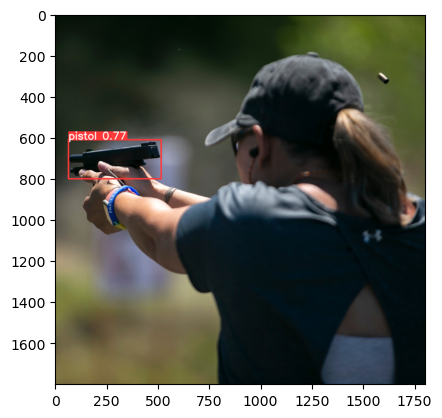

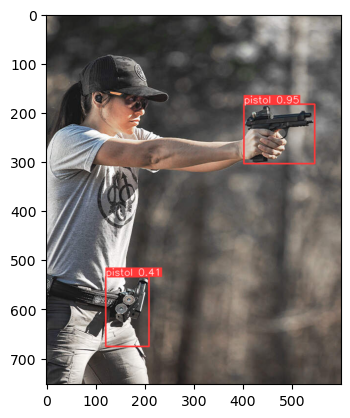

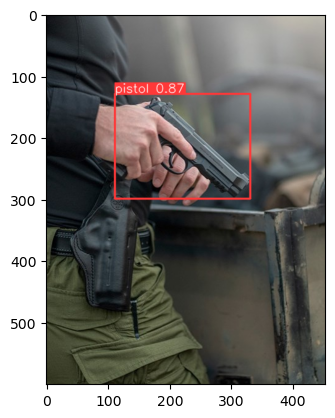

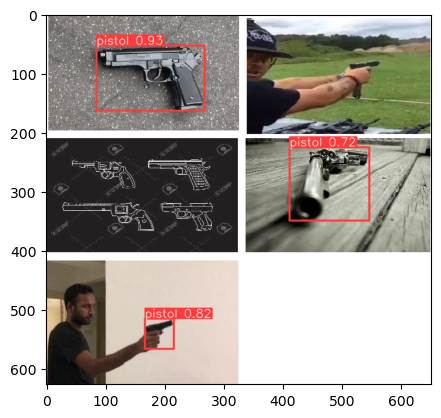

In [12]:
# from ultralytics import YOLO

# Load a pretrained YOLOv8n model
# model = YOLO('yolov8n.pt')

# Run inference on 'bus.jpg'
results = model(testing)  # results list

# Show the results
for i,r in enumerate(results):
    im_array = r.plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    plt.imshow(im)  # show image
    plt.show()
    im.save(f'results{i}.jpg')  # save image
    


### Youtube Video

In [13]:
# !pip install opencv-python

In [ ]:
yvideos = [
    f'{vdo_dir}{videos[0]}',
    f'{vdo_dir}{videos[1]}',
    f'{vdo_dir}{videos[2]}',
    f'{vdo_dir}{videos[3]}',
    'https://youtu.be/iRHUYys-7Lw?si=LfMX13B1iPex6F_Z',
]

import cv2
# from ultralytics import YOLO

# # Load the YOLOv8 model
# model = YOLO('yolov8n.pt')

# # Open the video file
cv2.destroyAllWindows()
# video_path = "path/to/your/video/file.mp4"
cap = cv2.VideoCapture(yvideos[1])
print(cap, cap.isOpened())
# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()
    print(end=f'{success}')
    if success:
        # Run YOLOv8 inference on the frame
        results = model(frame)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Display the annotated frame
        cv2.imshow("YOLOv8 Inference", annotated_frame)

        # Break the loop if 'q' is pressed
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()


In [47]:
len(results)

4

In [15]:
results = model(videos[0], stream=True)

In [16]:
results = list(results)


requirements: Ultralytics requirement ['yt-dlp'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 740.9 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 873.0/873.0 kB 1.0 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 15.3s, installed 1 package: ['yt-dlp']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

1/1: https://youtu.be/iRHUYys-7Lw?si=LfMX13B1iPex6F_Z... Success ✅ (2391 frames of shape 1920x1080 at 25.00 FPS)

0: 384x640 (no detections), 960.0ms
0: 384x640 (no detections), 708.1ms
0: 384x640 (no detections), 652.7ms
0: 384x640 (no detections), 550.5ms
0: 384x640 1 smartphone, 700.8ms
0: 384x640 1 knife, 740.8ms
0: 384x640 (no detections), 667.5ms
0: 384x640 (no detections), 693.5ms
0: 384x640 (no detections), 721.2ms
0: 384x640 (no

In [17]:
len(results)

53

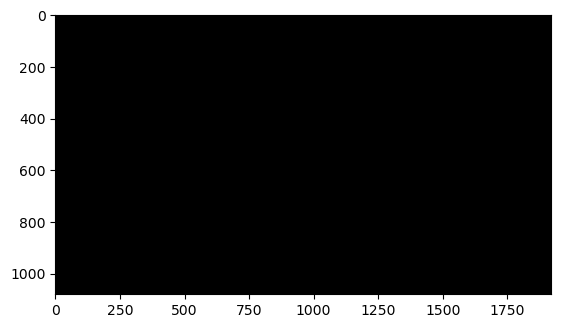

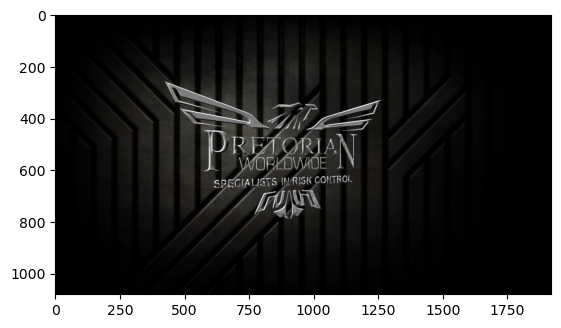

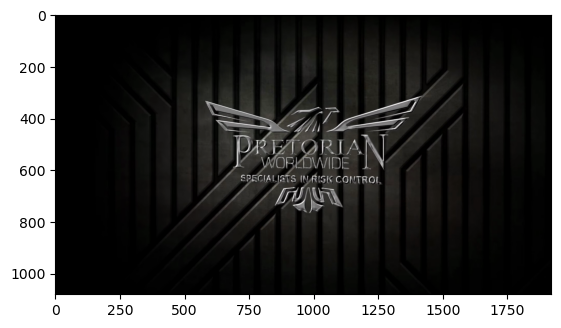

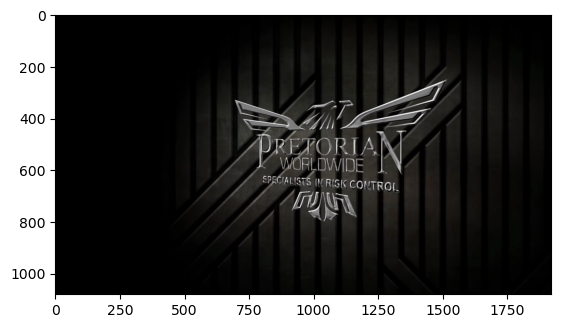

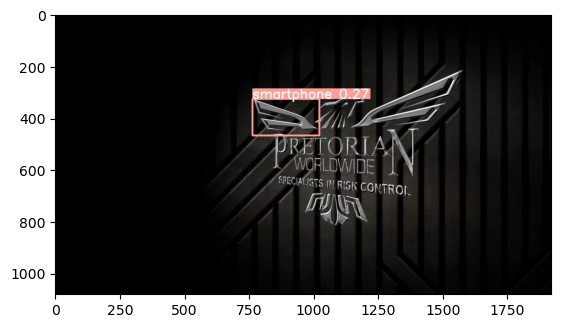

...

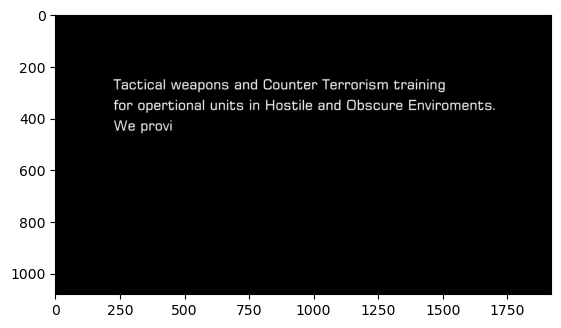

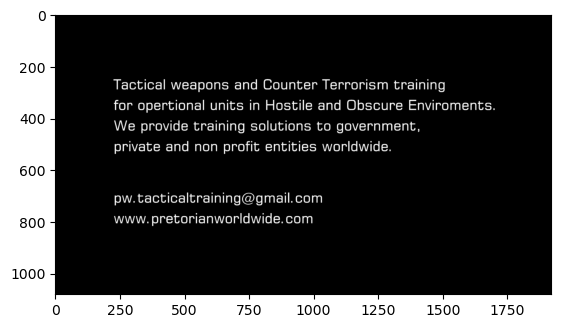

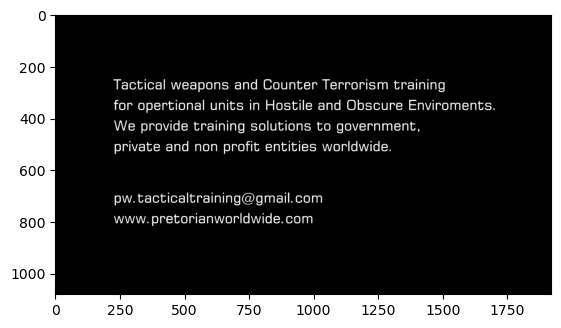

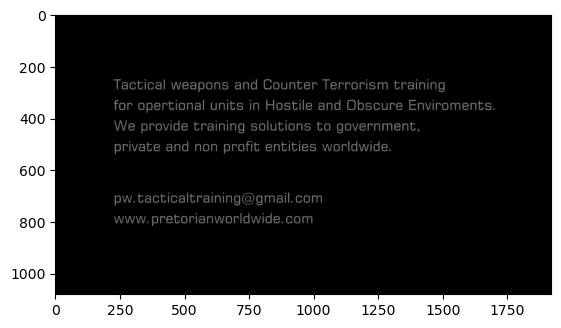

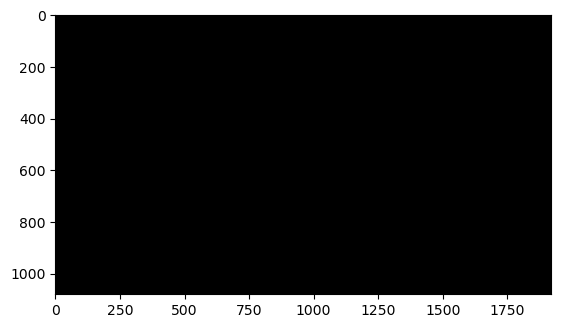

In [19]:
for i,r in enumerate(results):
    im_array = r.plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    plt.imshow(im)  # show image
    plt.show()
    im.save(f'outputs/videos/results{i}.jpg')  # save image
    
# for r in results:
#     im_array = r.plot()  # plot a BGR numpy array of predictions
#     im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
#     im.show()  # show image
#     im.save('results.jpg')  # save image

### Videos

In [2]:
vdo_dir = 'inputs/videos/'
videos = [
    'CQC & counter vehicle ambush drills.mp4',
    'How to Hold a Pistol | Special Forces Instruction | Tactical Rifleman.mp4',
    'IDF Pistol Shooting Technique in 5 Minutes.mp4',
    'Wilk Tactical _ Combat Pistol Course.mp4',
]

In [29]:
results = model(f'{vdo_dir}{videos[0]}', stream=True)

In [23]:
# results = list(results)
# len(results)

In [34]:
results = model(f'{vdo_dir}{videos[0]}', stream=True)

op_dir = f'outputs/videos/{videos[0].split(".")[0]}/'
os.makedirs(op_dir, exist_ok=True)
# plt.figure(figsize=(5,5))
for i,r in enumerate(results):
    im_array = r.plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    plt.imshow(im)  # show image
    # plt.show()
    im.save(f'{op_dir}results{i}.jpg')  # save image
    


video 1/1 (1/1679) /Users/jijnasu/Workspace/OD-WeaponDetection/Weapons and similar handled objects/Sohas_weapon-Detection-YOLOv5/inputs/videos/CQC & counter vehicle ambush drills.mp4: 384x640 (no detections), 371.4ms
video 1/1 (2/1679) /Users/jijnasu/Workspace/OD-WeaponDetection/Weapons and similar handled objects/Sohas_weapon-Detection-YOLOv5/inputs/videos/CQC & counter vehicle ambush drills.mp4: 384x640 (no detections), 361.0ms
video 1/1 (3/1679) /Users/jijnasu/Workspace/OD-WeaponDetection/Weapons and similar handled objects/Sohas_weapon-Detection-YOLOv5/inputs/videos/CQC & counter vehicle ambush drills.mp4: 384x640 (no detections), 356.7ms
video 1/1 (4/1679) /Users/jijnasu/Workspace/OD-WeaponDetection/Weapons and similar handled objects/Sohas_weapon-Detection-YOLOv5/inputs/videos/CQC & counter vehicle ambush drills.mp4: 384x640 (no detections), 357.1ms
video 1/1 (5/1679) /Users/jijnasu/Workspace/OD-WeaponDetection/Weapons and similar handled objects/Sohas_weapon-Detection-YOLOv5/in

KeyboardInterrupt: 

In [3]:
yvideos = [
    f'{vdo_dir}{videos[0]}',
    f'{vdo_dir}{videos[1]}',
    f'{vdo_dir}{videos[2]}',
    f'{vdo_dir}{videos[3]}',
]

import cv2
# from ultralytics import YOLO

# # Load the YOLOv8 model
# model = YOLO('yolov8n.pt')

# # Open the video file
cv2.destroyAllWindows()
# video_path = "path/to/your/video/file.mp4"
cap = cv2.VideoCapture(yvideos[1])
print(cap, cap.isOpened())
# Loop through the video frames
while cap.isOpened():
    # Read a frame from the video
    success, frame = cap.read()
    print(end=f'{success}')
    if success:
        # Run YOLOv8 inference on the frame
        results = model(frame)

        # Visualize the results on the frame
        annotated_frame = results[0].plot()

        # Display the annotated frame
        cv2.imshow("YOLOv8 Inference", annotated_frame)

        # Break the loop if 'q' is pressed
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break
    else:
        # Break the loop if the end of the video is reached
        break

# Release the video capture object and close the display window
cap.release()
cv2.destroyAllWindows()


< cv2.VideoCapture 0x1375d6890> True
True


0: 384x640 (no detections), 370.7ms
Speed: 2.4ms preprocess, 370.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 354.5ms
Speed: 1.1ms preprocess, 354.5ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 353.7ms
Speed: 1.2ms preprocess, 353.7ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 350.9ms
Speed: 1.2ms preprocess, 350.9ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 372.5ms
Speed: 1.1ms preprocess, 372.5ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 351.5ms
Speed: 1.8ms preprocess, 351.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 351.6ms
Speed: 1.0ms preprocess, 351.6ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 353.3ms
Speed: 1.1ms preprocess, 353.3ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 353.1ms
Speed: 1.3ms preprocess, 353.1ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 359.3ms
Speed: 1.1ms preprocess, 359.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 366.5ms
Speed: 1.1ms preprocess, 366.5ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 367.6ms
Speed: 2.1ms preprocess, 367.6ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 352.6ms
Speed: 1.1ms preprocess, 352.6ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 354.4ms
Speed: 1.0ms preprocess, 354.4ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 350.3ms
Speed: 1.0ms preprocess, 350.3ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 365.6ms
Speed: 1.1ms preprocess, 365.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 357.9ms
Speed: 1.1ms preprocess, 357.9ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 365.9ms
Speed: 1.4ms preprocess, 365.9ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 366.9ms
Speed: 1.4ms preprocess, 366.9ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 357.7ms
Speed: 1.5ms preprocess, 357.7ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 357.1ms
Speed: 1.1ms preprocess, 357.1ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 363.2ms
Speed: 1.1ms preprocess, 363.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 354.9ms
Speed: 1.1ms preprocess, 354.9ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 370.4ms
Speed: 1.1ms preprocess, 370.4ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 362.5ms
Speed: 1.2ms preprocess, 362.5ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 349.1ms
Speed: 1.0ms preprocess, 349.1ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 361.4ms
Speed: 1.2ms preprocess, 361.4ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 355.7ms
Speed: 1.1ms preprocess, 355.7ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 351.6ms
Speed: 1.3ms preprocess, 351.6ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 359.3ms
Speed: 1.6ms preprocess, 359.3ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 371.2ms
Speed: 1.7ms preprocess, 371.2ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 352.9ms
Speed: 1.2ms preprocess, 352.9ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 367.8ms
Speed: 1.2ms preprocess, 367.8ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 357.5ms
Speed: 1.0ms preprocess, 357.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 353.5ms
Speed: 1.1ms preprocess, 353.5ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 353.3ms
Speed: 1.1ms preprocess, 353.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 370.7ms
Speed: 1.2ms preprocess, 370.7ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 357.0ms
Speed: 1.1ms preprocess, 357.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 365.1ms
Speed: 1.3ms preprocess, 365.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 352.1ms
Speed: 1.2ms preprocess, 352.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 362.1ms
Speed: 1.0ms preprocess, 362.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 357.2ms
Speed: 1.1ms preprocess, 357.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 372.5ms
Speed: 2.0ms preprocess, 372.5ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 364.6ms
Speed: 1.4ms preprocess, 364.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 362.3ms
Speed: 1.0ms preprocess, 362.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 359.3ms
Speed: 1.0ms preprocess, 359.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 355.6ms
Speed: 1.9ms preprocess, 355.6ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 358.8ms
Speed: 1.1ms preprocess, 358.8ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 371.1ms
Speed: 1.5ms preprocess, 371.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 370.1ms
Speed: 1.0ms preprocess, 370.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 357.1ms
Speed: 1.3ms preprocess, 357.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 359.5ms
Speed: 1.1ms preprocess, 359.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 355.6ms
Speed: 1.2ms preprocess, 355.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 360.1ms
Speed: 1.1ms preprocess, 360.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 383.4ms
Speed: 1.1ms preprocess, 383.4ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 361.1ms
Speed: 1.2ms preprocess, 361.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 359.6ms
Speed: 1.2ms preprocess, 359.6ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 358.4ms
Speed: 1.1ms preprocess, 358.4ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 358.7ms
Speed: 1.3ms preprocess, 358.7ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 359.0ms
Speed: 1.4ms preprocess, 359.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 405.9ms
Speed: 1.1ms preprocess, 405.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 1 knife, 348.5ms
Speed: 1.3ms preprocess, 348.5ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 358.0ms
Speed: 1.0ms preprocess, 358.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 3 knifes, 377.1ms
Speed: 1.3ms preprocess, 377.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 2 knifes, 375.9ms
Speed: 1.1ms preprocess, 375.9ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 2 knifes, 385.3ms
Speed: 1.1ms preprocess, 385.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 578.9ms
Speed: 5.7ms preprocess, 578.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 527.2ms
Speed: 1.6ms preprocess, 527.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 524.7ms
Speed: 1.8ms preprocess, 524.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 530.3ms
Speed: 1.5ms preprocess, 530.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 584.3ms
Speed: 5.3ms preprocess, 584.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 501.0ms
Speed: 2.2ms preprocess, 501.0ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 510.5ms
Speed: 1.7ms preprocess, 510.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 558.3ms
Speed: 1.6ms preprocess, 558.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 501.8ms
Speed: 1.7ms preprocess, 501.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 519.4ms
Speed: 1.7ms preprocess, 519.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 571.5ms
Speed: 1.7ms preprocess, 571.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 547.4ms
Speed: 1.6ms preprocess, 547.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 504.2ms
Speed: 1.6ms preprocess, 504.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 519.7ms
Speed: 1.6ms preprocess, 519.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 500.2ms
Speed: 1.5ms preprocess, 500.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 558.7ms
Speed: 1.6ms preprocess, 558.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 563.8ms
Speed: 1.7ms preprocess, 563.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 508.6ms
Speed: 1.6ms preprocess, 508.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 513.3ms
Speed: 1.6ms preprocess, 513.3ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 566.9ms
Speed: 2.1ms preprocess, 566.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 490.0ms
Speed: 1.8ms preprocess, 490.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 497.6ms
Speed: 1.5ms preprocess, 497.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 602.6ms
Speed: 9.0ms preprocess, 602.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 538.2ms
Speed: 1.8ms preprocess, 538.2ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 505.1ms
Speed: 1.7ms preprocess, 505.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 523.3ms
Speed: 1.7ms preprocess, 523.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 558.4ms
Speed: 1.6ms preprocess, 558.4ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 1 knife, 530.3ms
Speed: 1.8ms preprocess, 530.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 563.7ms
Speed: 3.1ms preprocess, 563.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 2 knifes, 494.6ms
Speed: 1.6ms preprocess, 494.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 569.5ms
Speed: 1.4ms preprocess, 569.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 502.3ms
Speed: 1.6ms preprocess, 502.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 503.6ms
Speed: 1.4ms preprocess, 503.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 510.9ms
Speed: 1.6ms preprocess, 510.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 611.9ms
Speed: 3.1ms preprocess, 611.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 492.8ms
Speed: 1.7ms preprocess, 492.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 530.1ms
Speed: 1.7ms preprocess, 530.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 505.9ms
Speed: 1.6ms preprocess, 505.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 559.1ms
Speed: 1.5ms preprocess, 559.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 514.4ms
Speed: 1.6ms preprocess, 514.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 564.0ms
Speed: 1.8ms preprocess, 564.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 490.6ms
Speed: 1.6ms preprocess, 490.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 562.4ms
Speed: 2.2ms preprocess, 562.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 497.4ms
Speed: 1.5ms preprocess, 497.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 513.7ms
Speed: 1.4ms preprocess, 513.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 602.8ms
Speed: 1.6ms preprocess, 602.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 538.8ms
Speed: 2.4ms preprocess, 538.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 500.5ms
Speed: 1.5ms preprocess, 500.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 502.0ms
Speed: 2.2ms preprocess, 502.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 537.3ms
Speed: 1.6ms preprocess, 537.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 566.7ms
Speed: 1.7ms preprocess, 566.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 503.5ms
Speed: 1.5ms preprocess, 503.5ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 501.4ms
Speed: 1.4ms preprocess, 501.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 577.3ms
Speed: 1.7ms preprocess, 577.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 523.1ms
Speed: 1.7ms preprocess, 523.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 516.9ms
Speed: 1.7ms preprocess, 516.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 566.3ms
Speed: 2.9ms preprocess, 566.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 590.1ms
Speed: 1.6ms preprocess, 590.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 502.6ms
Speed: 1.8ms preprocess, 502.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 499.0ms
Speed: 1.7ms preprocess, 499.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 510.2ms
Speed: 1.6ms preprocess, 510.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 631.6ms
Speed: 2.1ms preprocess, 631.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 489.5ms
Speed: 1.6ms preprocess, 489.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 530.3ms
Speed: 2.7ms preprocess, 530.3ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 516.4ms
Speed: 1.6ms preprocess, 516.4ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 547.1ms
Speed: 1.8ms preprocess, 547.1ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 501.5ms
Speed: 1.6ms preprocess, 501.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 565.9ms
Speed: 4.8ms preprocess, 565.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 512.9ms
Speed: 1.5ms preprocess, 512.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 546.9ms
Speed: 1.6ms preprocess, 546.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 497.3ms
Speed: 1.6ms preprocess, 497.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 500.9ms
Speed: 1.5ms preprocess, 500.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 644.3ms
Speed: 1.5ms preprocess, 644.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 488.1ms
Speed: 1.9ms preprocess, 488.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 506.6ms
Speed: 1.4ms preprocess, 506.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 520.7ms
Speed: 1.5ms preprocess, 520.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 549.6ms
Speed: 1.8ms preprocess, 549.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 499.6ms
Speed: 1.6ms preprocess, 499.6ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 560.6ms
Speed: 4.1ms preprocess, 560.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 489.3ms
Speed: 2.0ms preprocess, 489.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 578.3ms
Speed: 1.4ms preprocess, 578.3ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 523.0ms
Speed: 1.6ms preprocess, 523.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 523.3ms
Speed: 1.6ms preprocess, 523.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 559.2ms
Speed: 1.6ms preprocess, 559.2ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 557.5ms
Speed: 1.5ms preprocess, 557.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 2 knifes, 497.4ms
Speed: 1.5ms preprocess, 497.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 506.6ms
Speed: 1.4ms preprocess, 506.6ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 513.3ms
Speed: 1.6ms preprocess, 513.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 558.9ms
Speed: 1.8ms preprocess, 558.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 557.8ms
Speed: 3.3ms preprocess, 557.8ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 513.7ms
Speed: 1.6ms preprocess, 513.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 525.2ms
Speed: 2.2ms preprocess, 525.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 524.8ms
Speed: 2.8ms preprocess, 524.8ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 510.7ms
Speed: 1.6ms preprocess, 510.7ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 558.4ms
Speed: 2.0ms preprocess, 558.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 560.1ms
Speed: 1.6ms preprocess, 560.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 517.0ms
Speed: 1.8ms preprocess, 517.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 525.5ms
Speed: 1.7ms preprocess, 525.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 511.1ms
Speed: 1.6ms preprocess, 511.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 645.4ms
Speed: 1.9ms preprocess, 645.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 507.9ms
Speed: 1.7ms preprocess, 507.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 516.3ms
Speed: 1.5ms preprocess, 516.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 529.3ms
Speed: 1.6ms preprocess, 529.3ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 652.5ms
Speed: 1.6ms preprocess, 652.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 623.5ms
Speed: 1.7ms preprocess, 623.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 509.8ms
Speed: 1.6ms preprocess, 509.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 550.4ms
Speed: 1.8ms preprocess, 550.4ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 521.5ms
Speed: 1.7ms preprocess, 521.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 543.1ms
Speed: 2.4ms preprocess, 543.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 584.5ms
Speed: 1.5ms preprocess, 584.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 558.4ms
Speed: 1.9ms preprocess, 558.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 523.7ms
Speed: 1.6ms preprocess, 523.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 514.9ms
Speed: 1.6ms preprocess, 514.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 524.7ms
Speed: 1.8ms preprocess, 524.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 581.2ms
Speed: 1.6ms preprocess, 581.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 556.7ms
Speed: 1.9ms preprocess, 556.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 514.0ms
Speed: 1.6ms preprocess, 514.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 556.5ms
Speed: 1.5ms preprocess, 556.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 558.0ms
Speed: 1.8ms preprocess, 558.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 658.4ms
Speed: 3.0ms preprocess, 658.4ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 692.8ms
Speed: 2.5ms preprocess, 692.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 646.8ms
Speed: 2.4ms preprocess, 646.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 634.1ms
Speed: 2.4ms preprocess, 634.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 585.0ms
Speed: 1.7ms preprocess, 585.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 683.6ms
Speed: 1.9ms preprocess, 683.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 605.6ms
Speed: 1.6ms preprocess, 605.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 560.1ms
Speed: 1.6ms preprocess, 560.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 561.5ms
Speed: 1.8ms preprocess, 561.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 569.4ms
Speed: 2.1ms preprocess, 569.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 555.8ms
Speed: 2.2ms preprocess, 555.8ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 603.5ms
Speed: 1.5ms preprocess, 603.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 593.0ms
Speed: 1.7ms preprocess, 593.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 559.0ms
Speed: 1.9ms preprocess, 559.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 570.1ms
Speed: 2.5ms preprocess, 570.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 592.2ms
Speed: 1.6ms preprocess, 592.2ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 647.0ms
Speed: 2.1ms preprocess, 647.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 558.5ms
Speed: 1.7ms preprocess, 558.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 565.9ms
Speed: 1.6ms preprocess, 565.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 579.9ms
Speed: 1.6ms preprocess, 579.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 538.6ms
Speed: 1.5ms preprocess, 538.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 603.2ms
Speed: 2.0ms preprocess, 603.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 559.6ms
Speed: 1.8ms preprocess, 559.6ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 583.7ms
Speed: 1.7ms preprocess, 583.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 544.6ms
Speed: 1.8ms preprocess, 544.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 563.8ms
Speed: 1.5ms preprocess, 563.8ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 669.5ms
Speed: 1.8ms preprocess, 669.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 557.8ms
Speed: 1.8ms preprocess, 557.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 548.2ms
Speed: 1.6ms preprocess, 548.2ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 548.4ms
Speed: 1.7ms preprocess, 548.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 618.5ms
Speed: 1.6ms preprocess, 618.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 548.9ms
Speed: 1.8ms preprocess, 548.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 594.8ms
Speed: 5.3ms preprocess, 594.8ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 575.5ms
Speed: 1.6ms preprocess, 575.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 550.2ms
Speed: 1.7ms preprocess, 550.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 543.6ms
Speed: 2.2ms preprocess, 543.6ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 548.3ms
Speed: 1.6ms preprocess, 548.3ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 646.5ms
Speed: 1.9ms preprocess, 646.5ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 542.2ms
Speed: 1.6ms preprocess, 542.2ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 526.5ms
Speed: 1.6ms preprocess, 526.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 528.5ms
Speed: 1.6ms preprocess, 528.5ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 569.9ms
Speed: 1.9ms preprocess, 569.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 564.9ms
Speed: 1.7ms preprocess, 564.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 517.1ms
Speed: 2.6ms preprocess, 517.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 550.6ms
Speed: 1.7ms preprocess, 550.6ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 543.0ms
Speed: 2.5ms preprocess, 543.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 512.1ms
Speed: 1.7ms preprocess, 512.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 602.1ms
Speed: 1.8ms preprocess, 602.1ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 546.2ms
Speed: 2.9ms preprocess, 546.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 534.4ms
Speed: 1.9ms preprocess, 534.4ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 519.1ms
Speed: 2.5ms preprocess, 519.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 544.6ms
Speed: 1.8ms preprocess, 544.6ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 621.7ms
Speed: 1.6ms preprocess, 621.7ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 505.6ms
Speed: 2.4ms preprocess, 505.6ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 524.0ms
Speed: 1.5ms preprocess, 524.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 535.0ms
Speed: 1.7ms preprocess, 535.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 581.1ms
Speed: 2.0ms preprocess, 581.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 559.2ms
Speed: 1.6ms preprocess, 559.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 521.7ms
Speed: 1.6ms preprocess, 521.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 599.3ms
Speed: 1.7ms preprocess, 599.3ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 680.7ms
Speed: 2.1ms preprocess, 680.7ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 858.2ms
Speed: 1.8ms preprocess, 858.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 886.8ms
Speed: 2.3ms preprocess, 886.8ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 770.1ms
Speed: 2.5ms preprocess, 770.1ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 689.1ms
Speed: 2.0ms preprocess, 689.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 868.0ms
Speed: 3.0ms preprocess, 868.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 533.2ms
Speed: 1.8ms preprocess, 533.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 556.3ms
Speed: 1.6ms preprocess, 556.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 564.8ms
Speed: 1.6ms preprocess, 564.8ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 508.7ms
Speed: 1.6ms preprocess, 508.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 510.9ms
Speed: 1.6ms preprocess, 510.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 551.6ms
Speed: 1.6ms preprocess, 551.6ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 561.1ms
Speed: 1.6ms preprocess, 561.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 507.1ms
Speed: 1.6ms preprocess, 507.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 568.2ms
Speed: 1.8ms preprocess, 568.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 516.2ms
Speed: 1.6ms preprocess, 516.2ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 556.9ms
Speed: 1.7ms preprocess, 556.9ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 511.1ms
Speed: 1.7ms preprocess, 511.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 514.0ms
Speed: 1.7ms preprocess, 514.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 548.7ms
Speed: 1.6ms preprocess, 548.7ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 595.1ms
Speed: 1.7ms preprocess, 595.1ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 504.9ms
Speed: 1.6ms preprocess, 504.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 508.3ms
Speed: 1.6ms preprocess, 508.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 573.7ms
Speed: 1.7ms preprocess, 573.7ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 503.4ms
Speed: 1.7ms preprocess, 503.4ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 507.9ms
Speed: 1.6ms preprocess, 507.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 563.9ms
Speed: 1.9ms preprocess, 563.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 541.5ms
Speed: 1.8ms preprocess, 541.5ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 553.5ms
Speed: 1.7ms preprocess, 553.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 532.9ms
Speed: 2.0ms preprocess, 532.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 529.7ms
Speed: 1.7ms preprocess, 529.7ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 546.3ms
Speed: 1.6ms preprocess, 546.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 505.8ms
Speed: 1.7ms preprocess, 505.8ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 505.8ms
Speed: 1.9ms preprocess, 505.8ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 508.3ms
Speed: 1.5ms preprocess, 508.3ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 562.0ms
Speed: 1.9ms preprocess, 562.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 494.9ms
Speed: 1.8ms preprocess, 494.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 503.0ms
Speed: 1.4ms preprocess, 503.0ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 557.1ms
Speed: 1.6ms preprocess, 557.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 538.1ms
Speed: 2.4ms preprocess, 538.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 knife, 505.9ms
Speed: 1.5ms preprocess, 505.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 518.2ms
Speed: 1.5ms preprocess, 518.2ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 1 pistol, 558.2ms
Speed: 1.6ms preprocess, 558.2ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 524.5ms
Speed: 1.8ms preprocess, 524.5ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 556.6ms
Speed: 1.7ms preprocess, 556.6ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 638.7ms
Speed: 2.2ms preprocess, 638.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)



True

0: 384x640 (no detections), 625.9ms
Speed: 1.6ms preprocess, 625.9ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)



True

[E thread_pool.cpp:109] Exception in thread pool task: mutex lock failed: Invalid argument
[E thread_pool.cpp:109] Exception in thread pool task: mutex lock failed: Invalid argument
[E thread_pool.cpp:109] Exception in thread pool task: mutex lock failed: Invalid argument
[E thread_pool.cpp:109] Exception in thread pool task: mutex lock failed: Invalid argument
[E thread_pool.cpp:109] Exception in thread pool task: mutex lock failed: Invalid argument
[E thread_pool.cpp:109] Exception in thread pool task: mutex lock failed: Invalid argument
[E thread_pool.cpp:109] Exception in thread pool task: mutex lock failed: Invalid argument


KeyboardInterrupt: 